# Topic Modeling of Tweets from January 6, 2021
Kaela Fong

In [1]:
import numpy as np
import pandas as pd

Reading in the data set. The data is from https://www.kaggle.com/datasets/codebreaker619/80000-tweets-from-us-capitol-riotsjan-6-2021

In [2]:
og_data = pd.read_csv('tweets.csv',encoding='latin1')
data = og_data[['text']]
data.head()

,text
0,we can adjust by population to get crude exces...
1,turning to labour or remainers like what would...
2,numbers of deaths are affected by population s...
3,here is a list of governors who preside over s...
4,convince me with facts on death rates and infe...


In [3]:
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.tokenize import word_tokenize

In [4]:
#for automatic linebreaks and multi-line cells.
pd.set_option('display.max_colwidth', -1)

#suppress all warnings with this
import warnings
warnings.filterwarnings("ignore")

C:\Users\kaela\AppData\Local\Temp\ipykernel_1104\828370818.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


In [5]:
data['text'] = data['text'].str.strip()

Showing Tweets as text

In [6]:
# Showing the tweets as text
data['text'].head(1)

0    we can adjust by population to get crude excess death rates 2020 will also be the highest since 1940 even with measures taken to limit covid spread 2020 will still top 1951 the year of a major flu epidemic without all our efforts 2020 could have been much worse 911
Name: text, dtype: object

In [7]:
# splitting text into words
data['words'] = data.text.str.strip().str.split('[\W_]+')

In [8]:
data['words'].head(1)

0    [we, can, adjust, by, population, to, get, crude, excess, death, rates, 2020, will, also, be, the, highest, since, 1940, even, with, measures, taken, to, limit, covid, spread, 2020, will, still, top, 1951, the, year, of, a, major, flu, epidemic, without, all, our, efforts, 2020, could, have, been, much, worse, 911]
Name: words, dtype: object

Table with Text and then the words of the text as lists

In [9]:
data[['text','words']][16:20]

,text,words
16,remember the lockdown rules 1 if death rates go down that means the lockdown is working 2 if death rates go up that means they would have gone up far more without the lockdown 3 whatever happens after the lockdown ends the answer is always going to be another lockdown,"[remember, the, lockdown, rules, 1, if, death, rates, go, down, that, means, the, lockdown, is, working, 2, if, death, rates, go, up, that, means, they, would, have, gone, up, far, more, without, the, lockdown, 3, whatever, happens, after, the, lockdown, ends, the, answer, is, always, going, to, be, another, lockdown]"
17,so it should be really considering its size and population still has one of the highest death rates in europe,"[so, it, should, be, really, considering, its, size, and, population, still, has, one, of, the, highest, death, rates, in, europe]"
18,a thing i learned today graft political refers to an intentional misdirection of official funds when a public officer is directed to purchase goods or services from a specific private interest at a cost far above regular market rates source,"[a, thing, i, learned, today, graft, political, refers, to, an, intentional, misdirection, of, official, funds, when, a, public, officer, is, directed, to, purchase, goods, or, services, from, a, specific, private, interest, at, a, cost, far, above, regular, market, rates, source]"
19,here is a list of governors who preside over states with higher deathpermillion rates than fls ron desantis whom the media have anointed public enemy 1 1 murphy d 2 cuomo d 3 baker r 4 raimondo d 5 lamont d 6 burgum r 7 noem r 8 reeves r,"[here, is, a, list, of, governors, who, preside, over, states, with, higher, deathpermillion, rates, than, fls, ron, desantis, whom, the, media, have, anointed, public, enemy, 1, 1, murphy, d, 2, cuomo, d, 3, baker, r, 4, raimondo, d, 5, lamont, d, 6, burgum, r, 7, noem, r, 8, reeves, r]"


In [10]:
# Make a list of the tweets
tweet_list = data['text'].astype(str).to_list()

In [11]:
# Getting all of the words in a single string
words_list = data['text'].astype(str).tolist()
raw_text = ''.join(words_list)

In [12]:
raw_text = raw_text.replace("amp", '')

In [13]:
raw_text

'we can adjust by population to get crude excess death rates 2020 will also be the highest since 1940 even with measures taken to limit covid spread 2020 will still top 1951 the year of a major flu epidemic without all our efforts 2020 could have been much worse 911turning to labour or remainers like what would you do different while sat on one of the worst economic recessions  death rates in the g7 its like driving a car off a cliff  while youre falling offering the wheel to the guy in the passenger seat go on you fix itnumbers of deaths are affected by population size we can also consider death rates as a proportion of the population crude death rates are shown below all improvements in the first decade of this century will be reversed this year spanish flu did the same in 1918 611here is a list of governors who preside over states with higher deathpermillion rates than fls ron desantis whom the media have anointed public enemy 1 1 murphy d 2 cuomo d 3 baker r 4 raimondo d 5 lamont d

In [14]:
all_words = raw_text.split()

In [15]:
type(words_list)

list

In [16]:
all_words[:10]

['we',
 'can',
 'adjust',
 'by',
 'population',
 'to',
 'get',
 'crude',
 'excess',
 'death']

In [77]:
def remove_stopwords(all_words):
    output_array=[]
    for word in all_words:
        temp_list=[]
        if word not in stopwords:
            temp_list.append(word)
        output_array.append(''.join(temp_list))
    return output_array

words_nsws=remove_stopwords(all_words)

In [87]:
# Removing empty strings from the word list
words_nsws = filter(None, words_nsws)
words_nsws = list(filter(None, words_nsws))

In [90]:
words_nsws

['adjust',
 'population',
 'get',
 'crude',
 'excess',
 'death',
 'rates',
 '2020',
 'also',
 'highest',
 'since',
 '1940',
 'even',
 'measures',
 'taken',
 'limit',
 'covid',
 'spread',
 '2020',
 'still',
 'top',
 '1951',
 'year',
 'major',
 'flu',
 'epidemic',
 'without',
 'efforts',
 '2020',
 'could',
 'much',
 'worse',
 '911turning',
 'labour',
 'remainers',
 'like',
 'would',
 'different',
 'sat',
 'one',
 'worst',
 'economic',
 'recessions',
 'death',
 'rates',
 'g7',
 'like',
 'driving',
 'car',
 'cliff',
 'youre',
 'falling',
 'offering',
 'wheel',
 'guy',
 'passenger',
 'seat',
 'go',
 'fix',
 'itnumbers',
 'deaths',
 'affected',
 'population',
 'size',
 'also',
 'consider',
 'death',
 'rates',
 'proportion',
 'population',
 'crude',
 'death',
 'rates',
 'shown',
 'improvements',
 'first',
 'decade',
 'century',
 'reversed',
 'year',
 'spanish',
 'flu',
 '1918',
 '611here',
 'list',
 'governors',
 'preside',
 'states',
 'higher',
 'deathpermillion',
 'rates',
 'fls',
 'ron',
 

In [89]:
### We'll make a temporary dictionary to hold the words
### Dictionaries are quite useful for word counts
word_dict = {}
## For each word in the text
for word in words_nsws:
    # if the word wasn't already in the dictionary
    if word not in word_dict.keys():
    # add it
        word_dict[word] = 1
    # otherwise
    else: # add 1 to the existing count
        word_dict[word] = word_dict[word] + 1
# Let's examine the dictionary
word_dict

{'adjust': 21,
 'population': 342,
 'get': 6237,
 'crude': 11,
 'excess': 116,
 'death': 927,
 'rates': 793,
 '2020': 970,
 'also': 2344,
 'highest': 515,
 'since': 1274,
 '1940': 2,
 'even': 2042,
 'measures': 383,
 'taken': 344,
 'limit': 96,
 'covid': 7201,
 'spread': 6607,
 'still': 2536,
 'top': 438,
 '1951': 1,
 'year': 1964,
 'major': 301,
 'flu': 372,
 'epidemic': 25,
 'without': 2555,
 'efforts': 128,
 'could': 2262,
 'much': 1619,
 'worse': 422,
 '911turning': 1,
 'labour': 142,
 'remainers': 8,
 'like': 4614,
 'would': 2874,
 'different': 409,
 'sat': 42,
 'one': 3648,
 'worst': 475,
 'economic': 600,
 'recessions': 6,
 'g7': 22,
 'driving': 68,
 'car': 359,
 'cliff': 5,
 'youre': 2759,
 'falling': 74,
 'offering': 125,
 'wheel': 16,
 'guy': 214,
 'passenger': 61,
 'seat': 95,
 'go': 3466,
 'fix': 171,
 'itnumbers': 1,
 'deaths': 948,
 'affected': 164,
 'size': 75,
 'consider': 154,
 'proportion': 17,
 'shown': 132,
 'improvements': 10,
 'first': 2015,
 'decade': 68,
 'centu

In [102]:
word_count = (    pd.DataFrame.from_dict(word_dict, orient='index')
    .T.stack()
    .reset_index(level=0, drop=True)
    .sort_index()
    .reset_index()
    .set_axis(['Word','Frequency'], 1, inplace=False)
    .sort_values(by='Frequency',ascending=False)
)

In [97]:
#word_count = pd.DataFrame.from_dict(word_dict, orient ='index')
#word_count.columns = ['N']

In [103]:
word_count

,Word,Frequency
69307,people,8505
98562,vaccine,7720
22869,covid,7201
98005,us,7016
67868,pandemic,6722
...,...,...
56846,mandemocrats,1
56845,mandemicera,1
56844,mandemic,1
56843,mandem,1


In [104]:
import matplotlib.pyplot as plt

<AxesSubplot:xlabel='Word'>

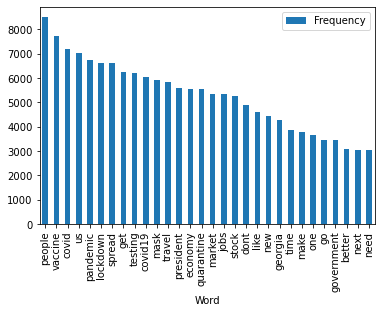

In [114]:
word_count.head(30).plot.bar(x='Word')

In [93]:
all_words

['we',
 'can',
 'adjust',
 'by',
 'population',
 'to',
 'get',
 'crude',
 'excess',
 'death',
 'rates',
 '2020',
 'will',
 'also',
 'be',
 'the',
 'highest',
 'since',
 '1940',
 'even',
 'with',
 'measures',
 'taken',
 'to',
 'limit',
 'covid',
 'spread',
 '2020',
 'will',
 'still',
 'top',
 '1951',
 'the',
 'year',
 'of',
 'a',
 'major',
 'flu',
 'epidemic',
 'without',
 'all',
 'our',
 'efforts',
 '2020',
 'could',
 'have',
 'been',
 'much',
 'worse',
 '911turning',
 'to',
 'labour',
 'or',
 'remainers',
 'like',
 'what',
 'would',
 'you',
 'do',
 'different',
 'while',
 'sat',
 'on',
 'one',
 'of',
 'the',
 'worst',
 'economic',
 'recessions',
 'death',
 'rates',
 'in',
 'the',
 'g7',
 'its',
 'like',
 'driving',
 'a',
 'car',
 'off',
 'a',
 'cliff',
 'while',
 'youre',
 'falling',
 'offering',
 'the',
 'wheel',
 'to',
 'the',
 'guy',
 'in',
 'the',
 'passenger',
 'seat',
 'go',
 'on',
 'you',
 'fix',
 'itnumbers',
 'of',
 'deaths',
 'are',
 'affected',
 'by',
 'population',
 'size'

In [19]:
tweet_list = data['text'].astype(str).to_list()

In [20]:
tweet_list[:5]

['we can adjust by population to get crude excess death rates 2020 will also be the highest since 1940 even with measures taken to limit covid spread 2020 will still top 1951 the year of a major flu epidemic without all our efforts 2020 could have been much worse 911',
 'turning to labour or remainers like what would you do different while sat on one of the worst economic recessions amp death rates in the g7 its like driving a car off a cliff amp while youre falling offering the wheel to the guy in the passenger seat go on you fix it',
 'numbers of deaths are affected by population size we can also consider death rates as a proportion of the population crude death rates are shown below all improvements in the first decade of this century will be reversed this year spanish flu did the same in 1918 611',
 'here is a list of governors who preside over states with higher deathpermillion rates than fls ron desantis whom the media have anointed public enemy 1 1 murphy d 2 cuomo d 3 baker r 4

In [21]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidfVectorizer=TfidfVectorizer(stop_words='english',
    max_features=1000)

tfidf = tfidfVectorizer.fit_transform(tweet_list)

In [22]:
print(tfidf.shape)
print(tfidf)

(82309, 1000)
  (0, 982)	0.23955274382520514
  (0, 314)	0.25139896861508354
  (0, 526)	0.2574474795199814
  (0, 988)	0.18382070591770294
  (0, 802)	0.13803888058260458
  (0, 192)	0.13277790385381452
  (0, 840)	0.2518408995046176
  (0, 552)	0.24926144828580052
  (0, 391)	0.24401474565489678
  (0, 13)	0.6302525377986957
  (0, 690)	0.22094991699521546
  (0, 212)	0.21693658886119183
  (0, 650)	0.2538940042518342
  (1, 994)	0.25520716520511005
  (1, 131)	0.3425337906478118
  (1, 49)	0.37048502034623726
  (1, 262)	0.3183581004671184
  (1, 983)	0.32814164829216697
  (1, 237)	0.33889383713280924
  (1, 494)	0.4198235051450518
  (1, 690)	0.30286391220842324
  (1, 212)	0.29736270054843944
  (2, 232)	0.21239956201989138
  (2, 213)	0.22857611094075267
  (2, 597)	0.2588265973555907
  :	:
  (82306, 8)	0.4558653225973505
  (82306, 292)	0.4164197466183646
  (82306, 192)	0.2656291861465314
  (82307, 270)	0.2644479124064267
  (82307, 995)	0.28094091510386277
  (82307, 961)	0.2594295280431095
  (82307, 54

In [23]:
# Reshapes the vectorizer output into something people can read
tfidf_csr = tfidf.tocsr()

In [24]:
# number of paragraphs
n = tfidf_csr.shape[0]
# A list of dictionaries, one per paragraph
tfidf_bytweet = [{} for _ in range (0, n)]
# a list of features
terms = tfidfVectorizer.get_feature_names()
#for each paragraph, lists the feature words and their tf-idf scores
for i, j in zip(*tfidf_csr.nonzero()):
    tfidf_bytweet[i][terms[j]] = tfidf_csr[i, j]

In [25]:
# looking at excluded words
tfidfVectorizer.stop_words_

{'agenparl',
 'insist',
 'teambcw',
 'ramcharan',
 'maritza',
 'tribalism',
 'yoganuary2021',
 'yp',
 'airflights',
 'sps',
 'rsrtcbuses',
 'brexiter',
 'environment',
 'filo',
 'ibew',
 'offshorewindfarm',
 'karaoke',
 '0in',
 '2take',
 'contribute',
 'divert',
 'stringent',
 'uprise',
 'whst',
 'reminders',
 'verbally',
 'digusting',
 'mommy',
 'delivering',
 '1025hour',
 'kickoff',
 'covidnsw',
 'obligatory',
 'fordy',
 'cougars',
 'schoolsour',
 'sterilisation',
 'rosimai',
 'extend',
 'unwrapping',
 'garda',
 'censorious',
 'moody',
 'blokes',
 'uos',
 'dryerballs',
 'setbacks',
 'sackjohnson',
 'pillar',
 'astonish',
 'actin',
 'amendments',
 'memberstates',
 'faceittn',
 'bootstrap',
 'marketswithmc',
 'fuel',
 'abound',
 '7501200week',
 'harden',
 'halfterm',
 'confirmedthis',
 'asbury',
 'oppress',
 'demoted',
 'advertisements',
 '5830',
 'armed',
 'infallibility',
 'utilities',
 'twicehm',
 'populated',
 '100day',
 'lyricism',
 'salaries',
 'pools',
 'schittscreekcup',
 'disr

In [26]:
# Getting the word list
terms = tfidfVectorizer.get_feature_names()

# Number of topics 
ntopics = 5

In [27]:
# Linking words to topics
def word_topic(tfidf,solution, wordlist):
    
    # Loading scores for each word on each topic/component.
    words_by_topic=tfidf.T * solution

    # Linking the loadings to the words in an easy-to-read way.
    components=pd.DataFrame(words_by_topic,index=wordlist)
    
    return components

# Extracts the top N words and their loadings for each topic.
def top_words(components, n_top_words):
    n_topics = range(components.shape[1])
    index= np.repeat(n_topics, n_top_words, axis=0)
    topwords=pd.Series(index=index)
    for column in range(components.shape[1]):
        # Sort the column so that highest loadings are at the top.
        sortedwords=components.iloc[:,column].sort_values(ascending=False)
        # Choose the N highest loadings.
        chosen=sortedwords[:n_top_words]
        # Combine loading and index into a string.
        chosenlist=chosen.index +" "+round(chosen,2).map(str) 
        topwords.loc[column]=[x for x in chosenlist]
    return(topwords)

# Number of words to look at for each topic.
n_top_words = 10

# LDA

In [28]:
# LDA
from sklearn.decomposition import LatentDirichletAllocation as LDA

lda = LDA(n_components=ntopics, 
          #doc_topic_prior=None, # Prior = 1/n_documents
          #topic_word_prior=1/ntopics,
          learning_decay=0.7, # Convergence rate.
          learning_offset=10.0, # Causes earlier iterations to have less influence on the learning
          max_iter=10, # when to stop even if the model is not converging (to prevent running forever)
          evaluate_every=-1, # Do not evaluate perplexity, as it slows training time.
          mean_change_tol=0.001, # Stop updating the document topic distribution in the E-step when mean change is < tol
          max_doc_update_iter=100, # When to stop updating the document topic distribution in the E-step even if tol is not reached
          n_jobs=-1, # Use all available CPUs to speed up processing time.
          verbose=1, # amount of output to give while iterating
          random_state=0
         )

tweets_lda = lda.fit_transform(tfidf) 

components_lda = word_topic(tfidf, tweets_lda, terms)

topwords=pd.DataFrame()

iteration: 1 of max_iter: 10
iteration: 2 of max_iter: 10
iteration: 3 of max_iter: 10
iteration: 4 of max_iter: 10
iteration: 5 of max_iter: 10
iteration: 6 of max_iter: 10
iteration: 7 of max_iter: 10
iteration: 8 of max_iter: 10
iteration: 9 of max_iter: 10
iteration: 10 of max_iter: 10


In [133]:
# Create dataframe from topic percentages for each tweet
lda_df = pd.DataFrame(tweets_lda*100).round(2) # getting the lda as data frame and making values easier to read

# rename the columns
lda_df.columns = [f'Topic {n+1}' for n in range(len(lda_df.columns))]

data.join(lda_df)

,text,words,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5
0,we can adjust by population to get crude excess death rates 2020 will also be the highest since 1940 even with measures taken to limit covid spread 2020 will still top 1951 the year of a major flu epidemic without all our efforts 2020 could have been much worse 911,"[we, can, adjust, by, population, to, get, crude, excess, death, rates, 2020, will, also, be, the, highest, since, 1940, even, with, measures, taken, to, limit, covid, spread, 2020, will, still, top, 1951, the, year, of, a, major, flu, epidemic, without, all, our, efforts, 2020, could, have, been, much, worse, 911]",4.94,4.79,80.84,4.74,4.69
1,turning to labour or remainers like what would you do different while sat on one of the worst economic recessions amp death rates in the g7 its like driving a car off a cliff amp while youre falling offering the wheel to the guy in the passenger seat go on you fix it,"[turning, to, labour, or, remainers, like, what, would, you, do, different, while, sat, on, one, of, the, worst, economic, recessions, amp, death, rates, in, the, g7, its, like, driving, a, car, off, a, cliff, amp, while, youre, falling, offering, the, wheel, to, the, guy, in, the, passenger, seat, go, on, you, fix, it]",5.20,35.33,5.21,49.18,5.07
2,numbers of deaths are affected by population size we can also consider death rates as a proportion of the population crude death rates are shown below all improvements in the first decade of this century will be reversed this year spanish flu did the same in 1918 611,"[numbers, of, deaths, are, affected, by, population, size, we, can, also, consider, death, rates, as, a, proportion, of, the, population, crude, death, rates, are, shown, below, all, improvements, in, the, first, decade, of, this, century, will, be, reversed, this, year, spanish, flu, did, the, same, in, 1918, 611]",5.53,5.54,77.73,5.69,5.51
3,here is a list of governors who preside over states with higher deathpermillion rates than fls ron desantis whom the media have anointed public enemy 1 1 murphy d 2 cuomo d 3 baker r 4 raimondo d 5 lamont d 6 burgum r 7 noem r 8 reeves r,"[here, is, a, list, of, governors, who, preside, over, states, with, higher, deathpermillion, rates, than, fls, ron, desantis, whom, the, media, have, anointed, public, enemy, 1, 1, murphy, d, 2, cuomo, d, 3, baker, r, 4, raimondo, d, 5, lamont, d, 6, burgum, r, 7, noem, r, 8, reeves, r]",5.85,6.48,5.88,75.98,5.82
4,convince me with facts on death rates and infection rates,"[convince, me, with, facts, on, death, rates, and, infection, rates]",7.55,7.60,69.33,7.98,7.55
...,...,...,...,...,...,...,...
82304,chocolate oda thaan suthuvvar polaby the way where is the mask,"[chocolate, oda, thaan, suthuvvar, polaby, the, way, where, is, the, mask]",8.45,8.44,8.42,66.35,8.34
82305,this could be us but yall dont wanna go on lockdown sit down wear a mask wash your hands or get a vaccine,"[this, could, be, us, but, yall, dont, wanna, go, on, lockdown, sit, down, wear, a, mask, wash, your, hands, or, get, a, vaccine]",4.90,4.92,4.91,80.37,4.90
82306,covid 19 grey black dust mask activated antipollution cycling sport bicycle mtb bike face mask instock,"[covid, 19, grey, black, dust, mask, activated, antipollution, cycling, sport, bicycle, mtb, bike, face, mask, instock]",6.30,6.32,6.38,74.62,6.39
82307,imagine if the energy people put into complaining about covid youth sports regulations went instead into getting people to embrace wearing a mask less people would die amp more people would appear to care about humanity all complainers amp lawsuit filers are welcome to be helpers,"[imagine, if, the, energy, people, put, into, complaining, about, covid, youth, sports, regulations, went, instead, into, getting, people, to, embrace, wearing, a, mask, less, people, would, die, amp, more, people, would, appear, to, care, about, humanity, all, complainers, amp, lawsuit, filers, are, welcome, to, be, helpers]",11.04,4.63,58.31,21.43,4.59


In [134]:
# Attach to the tweets
results = data.join(lda_df)

# Create a "Likely Topic" column based on max percentage
results['Likely Topic'] = [list(x).index(max(x))+1 for x in tweets_lda]

# Add the "query" column from the original data to compare categorization
results = results.join(og_data['query'])
results

,text,words,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Likely Topic,query
0,we can adjust by population to get crude excess death rates 2020 will also be the highest since 1940 even with measures taken to limit covid spread 2020 will still top 1951 the year of a major flu epidemic without all our efforts 2020 could have been much worse 911,"[we, can, adjust, by, population, to, get, crude, excess, death, rates, 2020, will, also, be, the, highest, since, 1940, even, with, measures, taken, to, limit, covid, spread, 2020, will, still, top, 1951, the, year, of, a, major, flu, epidemic, without, all, our, efforts, 2020, could, have, been, much, worse, 911]",4.94,4.79,80.84,4.74,4.69,3,death rates
1,turning to labour or remainers like what would you do different while sat on one of the worst economic recessions amp death rates in the g7 its like driving a car off a cliff amp while youre falling offering the wheel to the guy in the passenger seat go on you fix it,"[turning, to, labour, or, remainers, like, what, would, you, do, different, while, sat, on, one, of, the, worst, economic, recessions, amp, death, rates, in, the, g7, its, like, driving, a, car, off, a, cliff, amp, while, youre, falling, offering, the, wheel, to, the, guy, in, the, passenger, seat, go, on, you, fix, it]",5.20,35.33,5.21,49.18,5.07,4,death rates
2,numbers of deaths are affected by population size we can also consider death rates as a proportion of the population crude death rates are shown below all improvements in the first decade of this century will be reversed this year spanish flu did the same in 1918 611,"[numbers, of, deaths, are, affected, by, population, size, we, can, also, consider, death, rates, as, a, proportion, of, the, population, crude, death, rates, are, shown, below, all, improvements, in, the, first, decade, of, this, century, will, be, reversed, this, year, spanish, flu, did, the, same, in, 1918, 611]",5.53,5.54,77.73,5.69,5.51,3,death rates
3,here is a list of governors who preside over states with higher deathpermillion rates than fls ron desantis whom the media have anointed public enemy 1 1 murphy d 2 cuomo d 3 baker r 4 raimondo d 5 lamont d 6 burgum r 7 noem r 8 reeves r,"[here, is, a, list, of, governors, who, preside, over, states, with, higher, deathpermillion, rates, than, fls, ron, desantis, whom, the, media, have, anointed, public, enemy, 1, 1, murphy, d, 2, cuomo, d, 3, baker, r, 4, raimondo, d, 5, lamont, d, 6, burgum, r, 7, noem, r, 8, reeves, r]",5.85,6.48,5.88,75.98,5.82,4,death rates
4,convince me with facts on death rates and infection rates,"[convince, me, with, facts, on, death, rates, and, infection, rates]",7.55,7.60,69.33,7.98,7.55,3,death rates
...,...,...,...,...,...,...,...,...,...
82304,chocolate oda thaan suthuvvar polaby the way where is the mask,"[chocolate, oda, thaan, suthuvvar, polaby, the, way, where, is, the, mask]",8.45,8.44,8.42,66.35,8.34,4,mask
82305,this could be us but yall dont wanna go on lockdown sit down wear a mask wash your hands or get a vaccine,"[this, could, be, us, but, yall, dont, wanna, go, on, lockdown, sit, down, wear, a, mask, wash, your, hands, or, get, a, vaccine]",4.90,4.92,4.91,80.37,4.90,4,mask
82306,covid 19 grey black dust mask activated antipollution cycling sport bicycle mtb bike face mask instock,"[covid, 19, grey, black, dust, mask, activated, antipollution, cycling, sport, bicycle, mtb, bike, face, mask, instock]",6.30,6.32,6.38,74.62,6.39,4,mask
82307,imagine if the energy people put into complaining about covid youth sports regulations went instead into getting people to embrace wearing a mask less people would die amp more people would appear to care about humanity all complainers amp lawsuit filers are welcome to be helpers,"[imagine, if, the, energy, people, put, into, complaining, about, covid, youth, sports, regulations, went, instead, into, getting, people, to, embrace, wearing, a, mask, less, people, would, die, amp, more, people, would, appear, to, care, about, h

## Topic 1

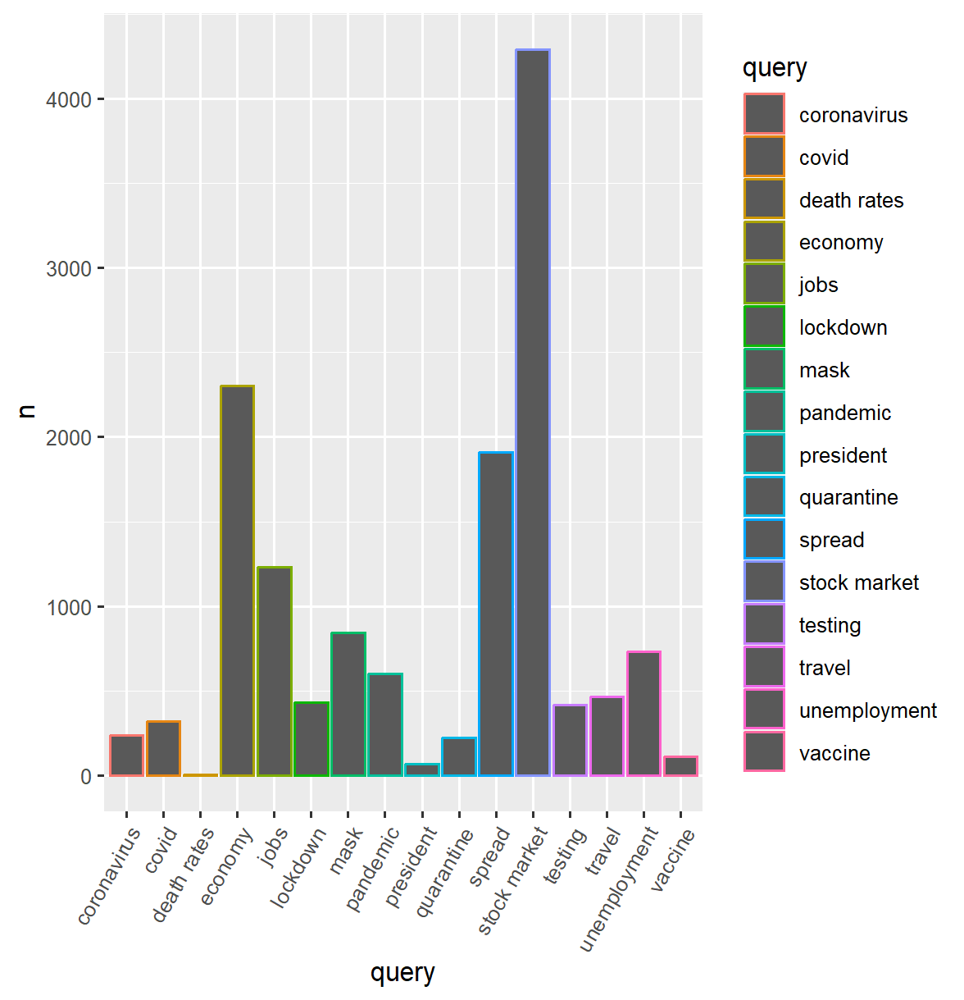

## This is Topic 2

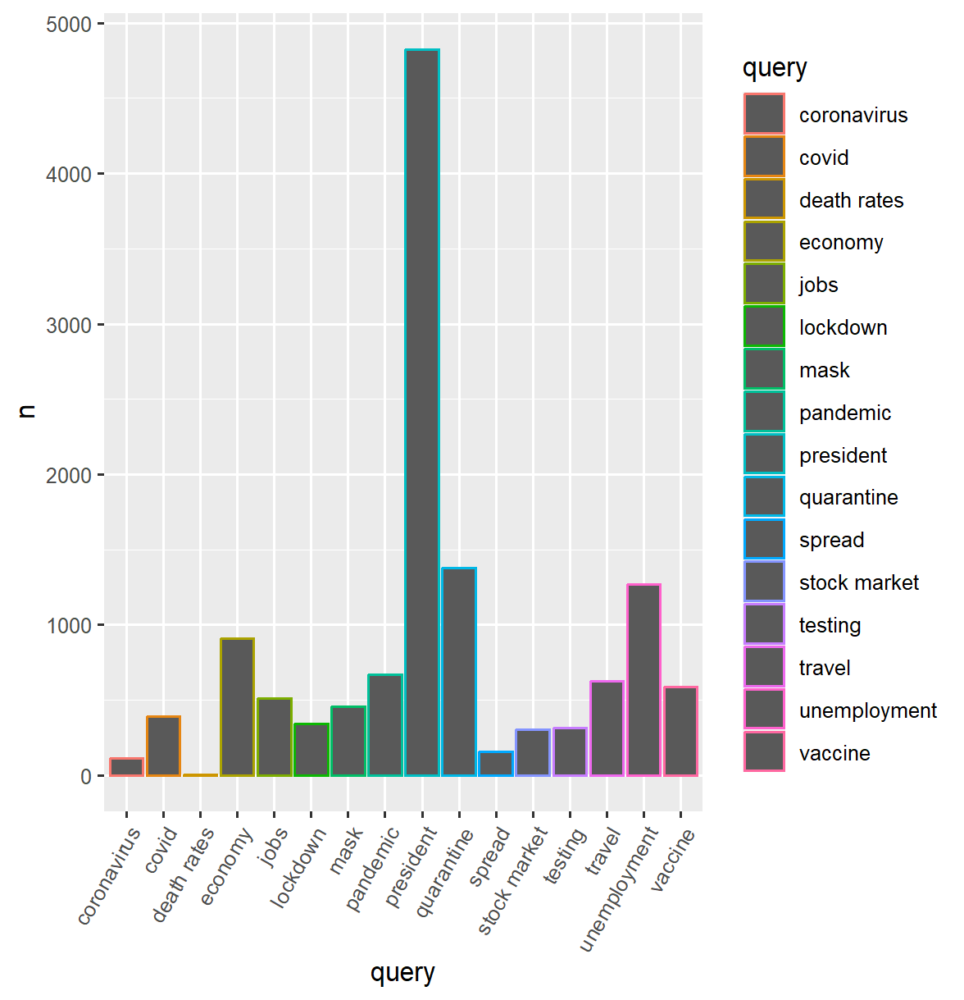

## Topic 3

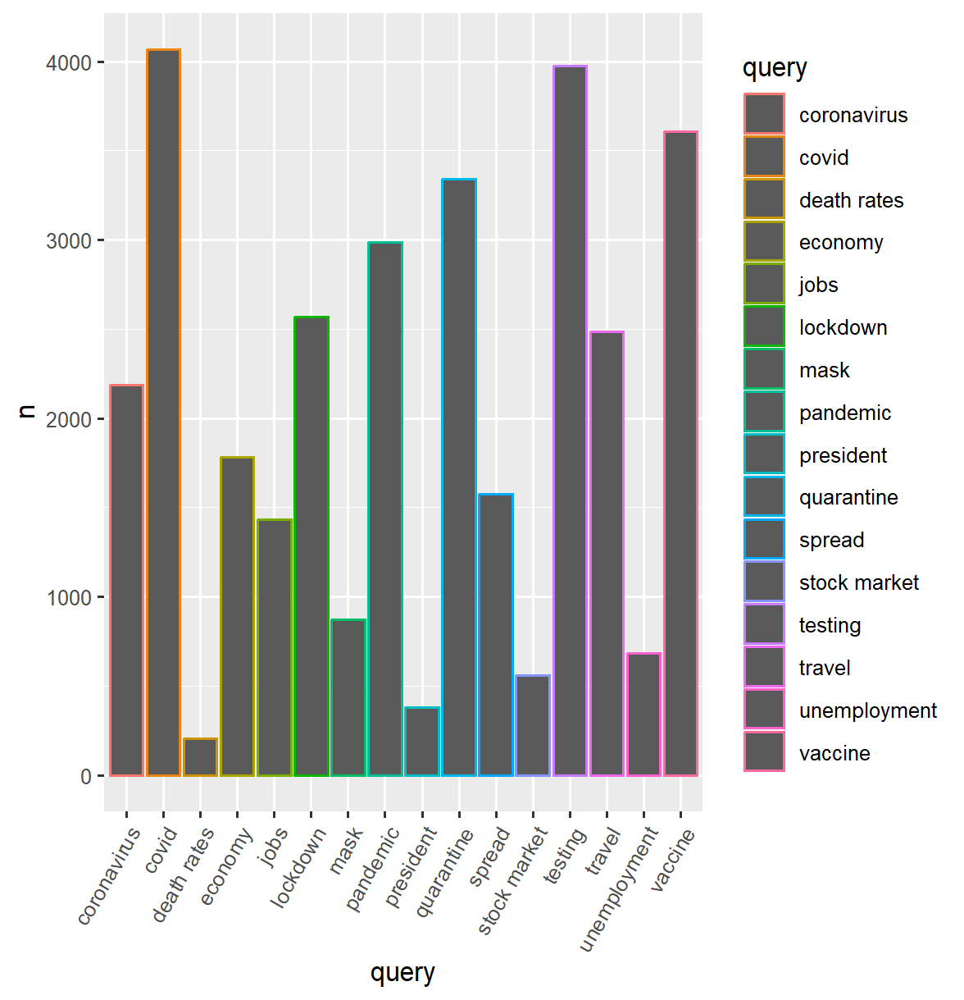

## Topic 4

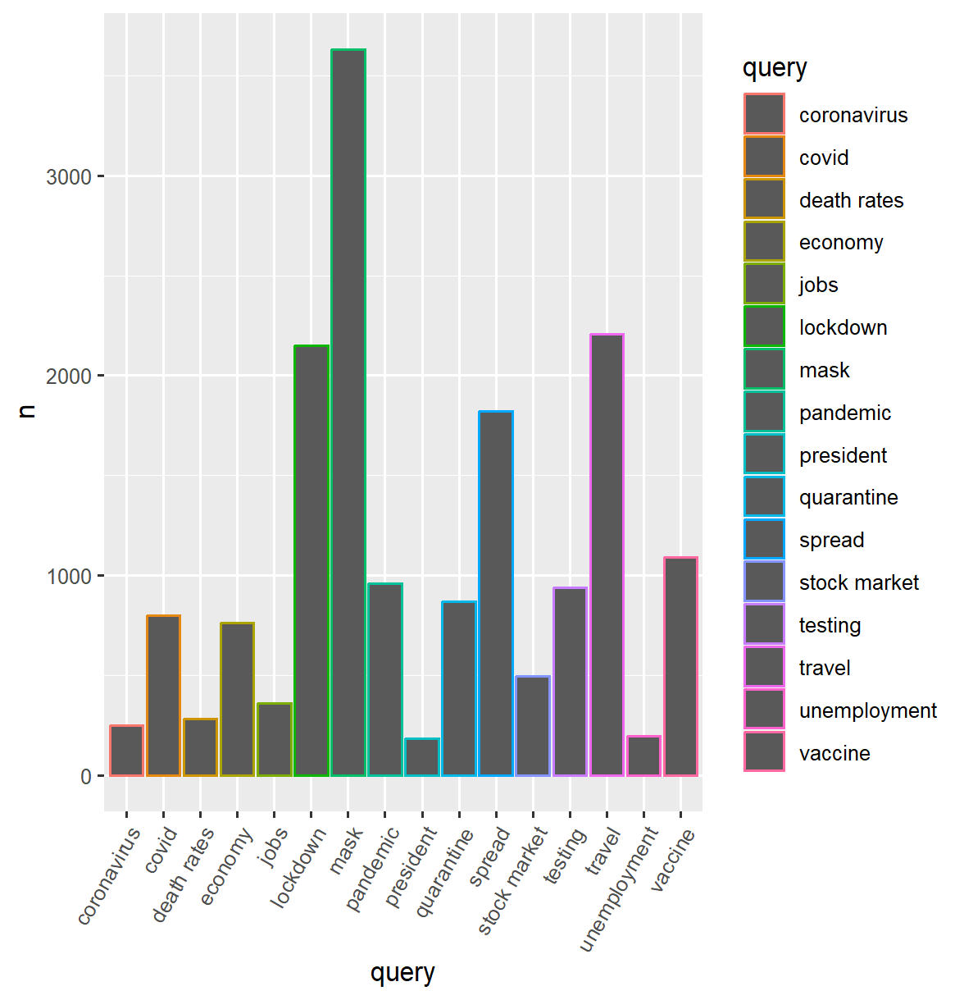

## Topic 5

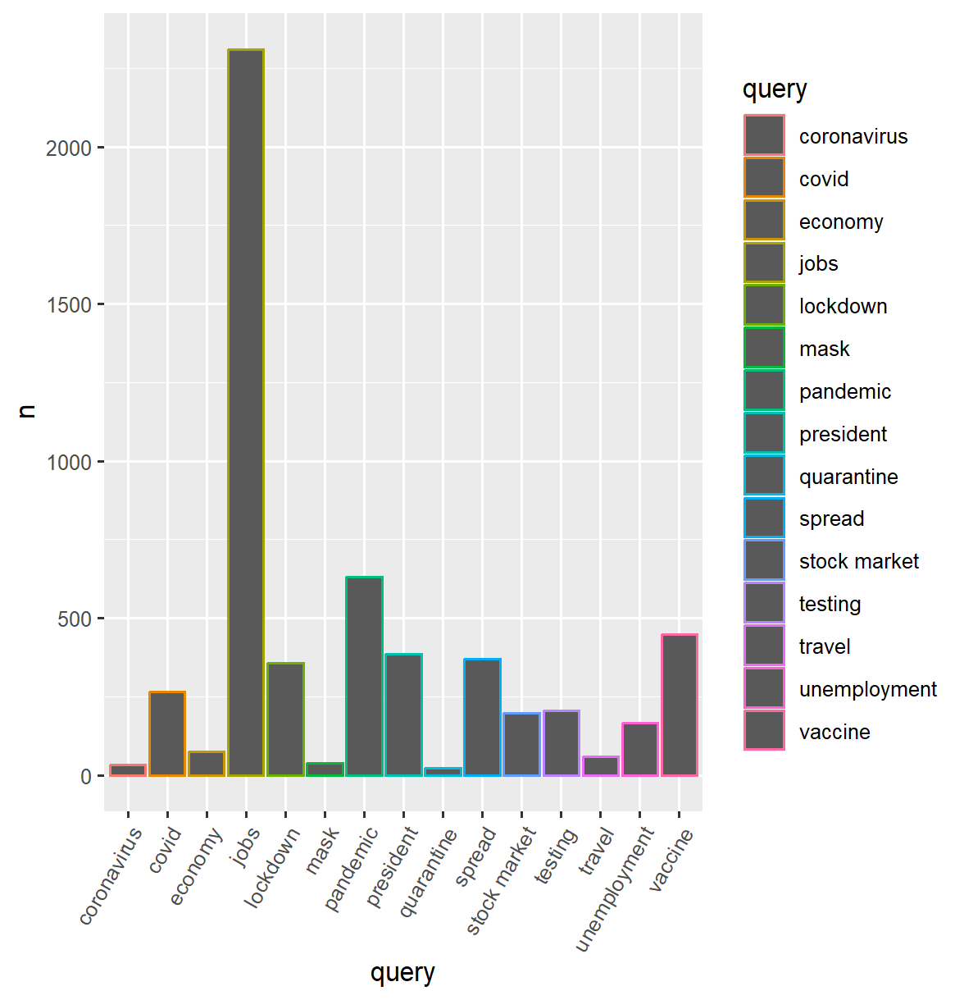

In [137]:
topwords['LDA']=top_words(components_lda, n_top_words)
topwords

,LDA
0,market 863.21
0,stock 828.46
0,economy 503.68
0,spread 460.16
0,mask 283.54
0,2021 281.24
0,amp 262.22
0,pandemic 259.95
0,open 252.9
0,jobs 249.39


In [115]:
lda_topics = pd.DataFrame()
for i in top_words(components_lda, n_top_words).index.unique():
    lda_topics[f'Topic {i+1}'] = top_words(components_lda, 10)[i].values
lda_topics = lda_topics.reset_index(drop=True)
lda_topics

,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5
0,market 863.21,president 974.41,vaccine 1016.28,mask 1027.12,jobs 459.46
1,stock 828.46,people 393.12,testing 917.64,lockdown 704.24,georgia 438.84
2,economy 503.68,capitol 380.87,covid 881.62,travel 618.13,healthcare 431.87
3,spread 460.16,youre 370.55,covid19 871.15,dont 528.83,office 417.9
4,mask 283.54,quarantine 356.95,quarantine 834.65,vaccine 501.26,ossoff 414.25
5,2021 281.24,trump 331.91,pandemic 734.34,wear 491.61,justice 413.47
6,amp 262.22,states 327.29,amp 676.73,amp 355.74,stand 413.37
7,pandemic 259.95,say 314.15,people 656.57,spread 353.43,having 412.77
8,open 252.9,united 309.03,lockdown 613.51,people 344.92,fight 412.7
9,jobs 249.39,unemployment 304.93,travel 586.39,just 337.78,nation 411.49


# LSA 

In [82]:
# LSA

from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer

svd= TruncatedSVD(ntopics)
lsa = make_pipeline(svd, Normalizer(copy=False))
tweets_lsa = lsa.fit_transform(tfidf)

components_lsa = word_topic(tfidf, tweets_lsa, terms)

topwords['LSA']=top_words(components_lsa, n_top_words)                

In [83]:
# top words by topic for both LSA and LDA models
topwords

,LSA,LDA
0,jobs 999.94,market 863.21
0,better 566.73,stock 828.46
0,georgia 561.75,economy 503.68
0,office 540.49,spread 460.16
0,fight 537.19,mask 283.54
0,justice 529.52,2021 281.24
0,having 526.9,amp 262.22
0,healthcare 523.62,pandemic 259.95
0,ossoff 519.97,open 252.9
0,nation 514.65,jobs 249.39


# Another way of LDA

In [91]:
from sklearn.decomposition import LatentDirichletAllocation
LDA_model=LatentDirichletAllocation(n_components=10,learning_method='online',
                                    random_state=42,max_iter=1) 
lda_top=LDA_model.fit_transform(tfIdf)

In [32]:
print(lda_top.shape)
print(lda_top)

(40704, 10)
[[0.0175915  0.45463941 0.01759111 ... 0.27664545 0.01759136 0.01759436]
 [0.39081055 0.32390212 0.01852958 ... 0.0185308  0.06828185 0.06710761]
 [0.02497424 0.37257377 0.08541688 ... 0.02497697 0.02497416 0.02498239]
 ...
 [0.03373504 0.69637438 0.03374407 ... 0.03373799 0.03373401 0.03373401]
 [0.19800719 0.59980582 0.02526943 ... 0.02529742 0.02527068 0.02526933]
 [0.05976968 0.01978995 0.42114105 ... 0.25463085 0.01978951 0.01978971]]


In [33]:
print("Tweet 0: ")
for i,topic in enumerate(lda_top[0]):
  print("Topic ",i,": ",topic*100,"%")

# topic 1 is most dominant in 1st tweet

Tweet 0: 
Topic  0 :  1.7591503068442167 %
Topic  1 :  45.4639409263407 %
Topic  2 :  1.7591114204688305 %
Topic  3 :  1.7592469824678145 %
Topic  4 :  1.759106409634457 %
Topic  5 :  14.557228116497248 %
Topic  6 :  1.7590986937305688 %
Topic  7 :  27.66454491489504 %
Topic  8 :  1.7591364804179148 %
Topic  9 :  1.759435748703216 %


In [34]:
print(LDA_model.components_)
print(LDA_model.components_.shape) 

[[1.16809237e-01 1.00055773e-01 1.00003050e-01 ... 1.01408315e-01
  1.13153723e-01 1.00022142e-01]
 [8.07765822e+01 7.85893678e+01 1.00002975e-01 ... 1.00397915e-01
  1.69747394e+02 1.03320679e-01]
 [1.48848224e-01 1.40881933e-01 1.02086520e-01 ... 1.02252879e-01
  1.00006373e-01 1.00005974e-01]
 ...
 [1.04956096e-01 1.04544508e+01 1.00006071e-01 ... 1.00020249e-01
  1.00184498e-01 1.00011605e-01]
 [2.09949110e-01 1.00070101e-01 1.00007314e-01 ... 1.00387781e-01
  1.00007807e-01 1.00007122e-01]
 [1.00821485e-01 1.00020374e-01 4.20556845e+01 ... 1.31805642e-01
  1.00739042e-01 1.00002621e-01]]
(10, 1000)


In [35]:
vocab = tfIdfVectorizer.get_feature_names()

columns = []
words = []

for i, comp in enumerate(LDA_model.components_):
    vocab_comp = zip(vocab, comp)
    sorted_words = sorted(vocab_comp, key= lambda x:x[1], reverse=True)
    sorted_words = dict(sorted_words)
    topic = "Topic "+str(i)
    columns.append(topic)
    words.append(sorted_words.keys())

In [36]:
topics_relevant_words = pd.DataFrame(words).transpose()
topics_relevant_words.columns = columns
topics_relevant_words.head(20)

,Topic 0,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9
0,dark,lockdown,georgia,lockdown,stand,survive,youre,nation,great,apply
1,join,job,job,zone,chapter,create,medium,confront,normal,date
2,open,economy,justice,launder,project,total,list,better,winter,find
3,lockdown,people,senator,instalment,johnson,report,someone,office,stock,believe
4,launch,amp,jon,designer,boris,detail,nigeria,healthcare,notice,theyre
5,mission,get,congratulation,life,woman,billion,vaccinate,job,scotland,driver
6,mental,work,story,person,industry,action,maybe,lockdown,buy,teacher
7,education,government,ossoff,another,third,product,vaccination,people,market,want
8,sit,make,fight,laptop,must,house,germany,investigation,group,drive
9,wan,need,next,rd,police,growth,curve,na,guy,true


# NNMF

In [92]:
# NNMF

from sklearn.decomposition import NMF

nmf = NMF(alpha=0.0, 
          init='nndsvdar', # how starting value are calculated
          l1_ratio=0.0, # Sets whether regularization is L2 (0), L1 (1), or a combination (values between 0 and 1)
          max_iter=200, # when to stop even if the model is not converging (to prevent running forever)
          n_components=ntopics, 
          random_state=0, 
          solver='cd', # Use Coordinate Descent to solve
          tol=0.0001, # model will stop if tfidf-WH <= tol
          verbose=1 # amount of output to give while iterating
         )
tweets_nmf = nmf.fit_transform(tfidf) 

components_nmf = word_topic(tfidf, tweets_nmf, terms)

topwords['NNMF']=top_words(components_nmf, n_top_words)

violation: 1.0
violation: 0.12878764393432124
violation: 0.03924830157946629
violation: 0.019042252408137415
violation: 0.011149024653971615
violation: 0.007197456153111171
violation: 0.004920112726143807
violation: 0.0034983789541732104
violation: 0.002561826628128232
violation: 0.0019257147723736713
violation: 0.0014804751932209952
violation: 0.001161362559643274
violation: 0.0009265332845584021
violation: 0.0007524102727753642
violation: 0.0006206124268032693
violation: 0.0005177896897642476
violation: 0.00043608346425460316
violation: 0.00037023150278628114
violation: 0.00031661583608355364
violation: 0.0002724637072025481
violation: 0.00023565421990480532
violation: 0.00020464532040696985
violation: 0.0001783711660436482
violation: 0.00015601660829492426
violation: 0.00013687134675935376
violation: 0.00012032023158429812
violation: 0.00010594863914088998
violation: 9.343690046393497e-05
Converged at iteration 29


In [93]:
topwords

,LSA,LDA,NNMF
0,jobs 999.94,market 863.21,confronted 69.07
0,better 566.73,stock 828.46,georgias 69.04
0,georgia 561.75,economy 503.68,chapter 69.0
0,office 540.49,spread 460.16,2017 68.9
0,fight 537.19,mask 283.54,standing 68.88
0,justice 529.52,2021 281.24,senator 68.79
0,having 526.9,amp 262.22,justice 68.65
0,healthcare 523.62,pandemic 259.95,jon 68.39
0,ossoff 519.97,open 252.9,nations 68.29
0,nation 514.65,jobs 249.39,ossoff 68.29
